In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from autosklearn.classification import AutoSklearnClassifier
from sklearn.metrics import accuracy_score
import pandas as pd
# from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler

import numpy as np

/home/danish/anaconda3/envs/AutoML/lib/python3.9/site-packages/scipy/__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
import os
import pandas as pd

# Path to the directory containing your CSV files
directory_path = '/home/danish/Datasets/ICS/triple'
# Get a list of all CSV files in the directory
csv_files = [file for file in os.listdir(directory_path) if file.endswith('.csv')]

# Initialize an empty DataFrame to store the combined data
combined_df = pd.DataFrame()

# Loop through each CSV file and concatenate its data to the combined DataFrame
for csv_file in csv_files:
    file_path = os.path.join(directory_path, csv_file)
    df = pd.read_csv(file_path).dropna()
    combined_df = pd.concat([combined_df, df], ignore_index=True)

# Display the combined DataFrame
data = combined_df # .sample(frac=0.5, random_state=42)
data.shape
# Optionally, you can save the combined DataFrame to a new CSV file
# combined_df.to_csv('/path/to/combined_data.csv', index=False)

(78377, 129)

In [3]:
# List of bad or constant columns 
columns_to_drop = ['R3-PA:Z', 'R1-PA:Z', 'R2-PA:Z', 'R4-PA:Z', 'snort_log1', 'snort_log2', 'control_panel_log2', 'control_panel_log1']

# Remove specified columns
data = data.drop(columns=columns_to_drop)

In [4]:

# Load your dataset (replace 'your_dataset.csv' with your actual dataset file)
# data = pd.read_csv('/home/danish/Downloads/Datasets/ICS/binaryAllNaturalPlusNormalVsAttacks/data1.csv')
data.replace([np.inf, -np.inf], 1e15, inplace=True)
# data

# Extract the numerical columns for normalization
numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns
data[numerical_cols]
data

,R1-PA1:VH,R1-PM1:V,R1-PA2:VH,R1-PM2:V,R1-PA3:VH,R1-PM3:V,R1-PA4:IH,R1-PM4:I,R1-PA5:IH,R1-PM5:I,...,R4:S,control_panel_log3,control_panel_log4,relay1_log,relay2_log,relay3_log,relay4_log,snort_log3,snort_log4,marker
0,129.047284,133139.0637,9.069922,133113.9904,-110.907440,133214.2835,129.522839,477.18466,4.262806,509.59513,...,0.0,0,0,0,0,0,0,0,0,NoEvents
1,128.949881,133063.8439,8.978249,133013.6974,-111.016302,133088.9172,129.368141,477.91710,4.125296,510.32757,...,0.0,0,0,0,0,0,0,0,0,NoEvents
2,128.222225,132336.7191,8.262051,132286.5725,-111.749688,132386.8656,128.382653,482.12863,3.265859,512.70800,...,0.0,0,0,0,0,0,0,0,0,NoEvents
3,123.850557,129202.5603,3.867465,129152.4138,-116.132816,129277.7801,121.965526,505.74982,-1.249048,525.52570,...,0.0,0,0,0,0,0,0,0,0,NoEvents
4,128.594648,132236.4260,8.623015,132186.2794,-111.354348,132261.4993,132.364710,276.86232,8.829280,289.13069,...,0.0,0,0,0,0,0,0,0,0,NoEvents
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78372,35.603597,132286.5725,-84.373765,132236.4260,155.626796,132361.7923,39.998184,249.76204,-81.073528,251.77625,...,0.0,0,0,0,0,0,0,0,0,Natural
78373,35.374414,132336.7191,-84.602948,132286.5725,155.397613,132411.9389,38.462657,253.60735,-82.081934,253.79046,...,0.0,0,0,0,0,0,0,0,0,Natural
78374,35.368685,132336.7191,-84.608678,132286.5725,155.391884,132411.9389,38.508493,253.60735,-82.139230,254.15668,...,0.0,0,0,0,0,0,0,0,0,Natural
78375,35.305659,132336.7191,-84.665973,132286.5725,155.334588,132411.9389,38.244933,253.60735,-82.374142,254.33979,...,0.0,0,0,0,0,0,0,0,0,Natural


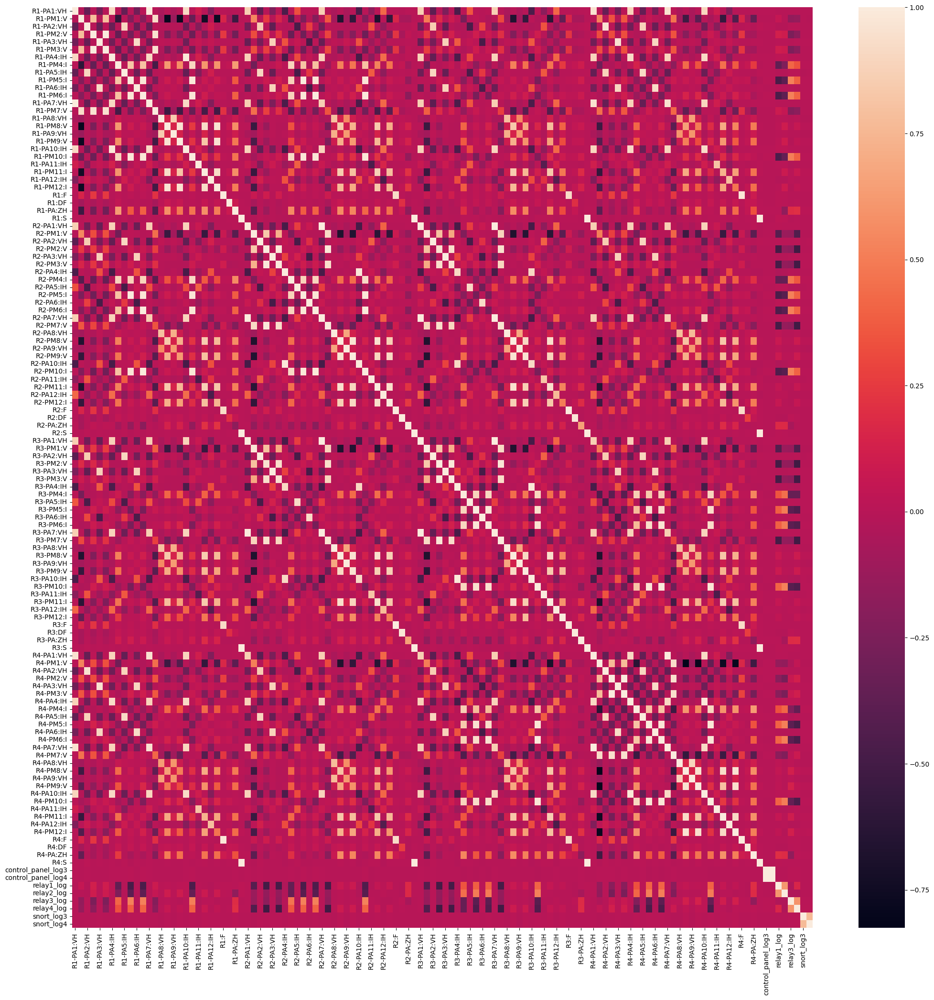

In [5]:

corr = pd.DataFrame(data.drop('marker', axis=1)).corr()

plt.figure(figsize=(25,25))

sns.heatmap(corr)

plt.show()

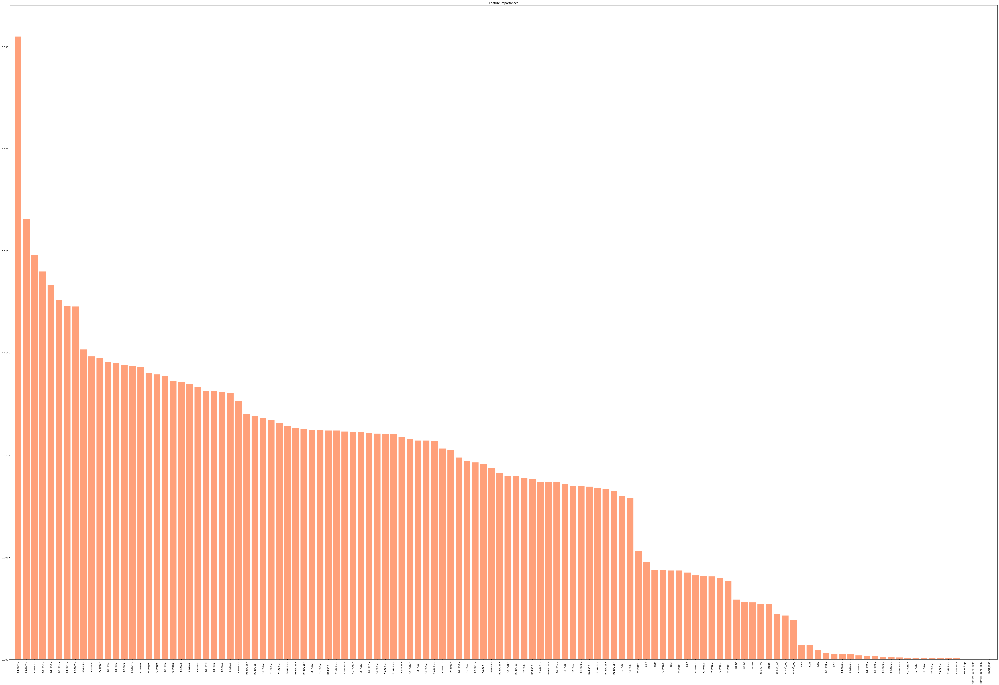

In [6]:
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import ExtraTreesClassifier

et = ExtraTreesClassifier(n_estimators = 100, class_weight='balanced', random_state=42)
et.fit(data.drop('marker', axis=1), data['marker'].tolist())
importances = et.feature_importances_
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(75,50))
plt.title("Feature importances")
plt.bar(range(data.drop('marker', axis=1).shape[1]), importances[indices],
        color="lightsalmon", align="center")
plt.xticks(range(data.drop('marker', axis=1).shape[1]), data.drop('marker', axis=1).columns[indices], rotation=90)
plt.xlim([-1, data.drop('marker', axis=1).shape[1]])
plt.show()

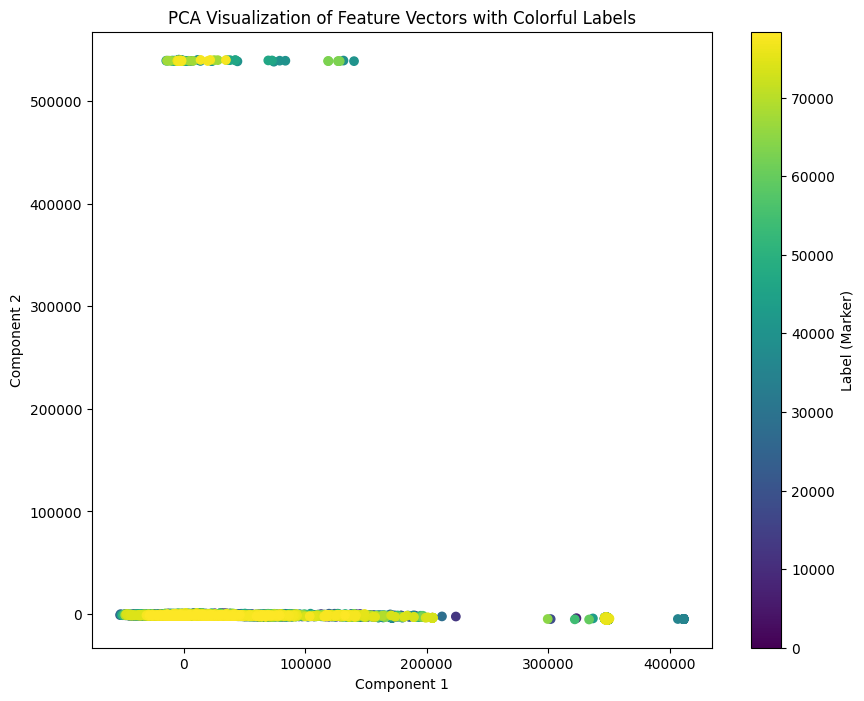

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Assuming 'data' contains your DataFrame with features and labels
features1 = data.drop('marker', axis=1)  # Features
labels = data['marker']  # Labels

# Perform PCA for dimensionality reduction
pca = PCA(n_components=2)  # Reduce to 2 dimensions for visualization
components = pca.fit_transform(features1)
reduced_df = pd.DataFrame(components, columns=['Component 1', 'Component 2'])

# Plot PCA visualization with colored points based on labels
plt.figure(figsize=(10, 8))
plt.scatter(reduced_df['Component 1'], reduced_df['Component 2'], c=range(0,78377), cmap='viridis')
plt.title('PCA Visualization of Feature Vectors with Colorful Labels')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.colorbar(label='Label (Marker)')
plt.show()


Explained Variance Ratio: [0.50922156 0.30467767 0.10109657]


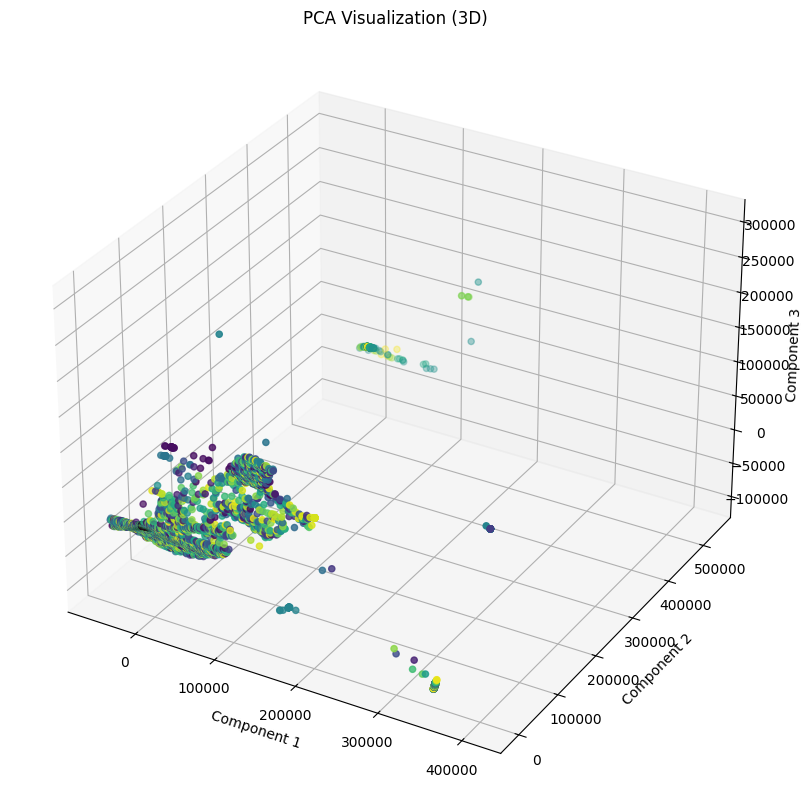

In [8]:
# Assuming 'df' contains your data
features1 = data.drop('marker', axis=1)  # Features
label = data['marker']  # Labels

from sklearn.decomposition import PCA

pca = PCA(n_components=3)  # Reduce to 2 dimensions for visualization
components = pca.fit_transform(features1)
print("Explained Variance Ratio:", pca.explained_variance_ratio_)

import matplotlib.pyplot as plt

# Plotting 3D PCA visualization
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(components[:, 0], components[:, 1], components[:, 2], c=range(0,78377), cmap='viridis')
ax.set_title('PCA Visualization (3D)')
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
plt.show()


In [9]:
et = ExtraTreesClassifier(n_estimators = 100, class_weight='balanced', random_state=42)

# sfm = SelectFromModel(rf, threshold=0.00025)
sfm = SelectFromModel(et)
sfm.fit(data.drop('marker', axis=1), data['marker'].tolist())
# X_important_train = sfm.transform(X_train)
# X_important_test = sfm.transform(X_test)

feature_vector_1 = sfm.transform(data.drop('marker', axis=1))

# rf = RandomForestClassifier(n_estimators = 100, class_weight='balanced', random_state=42)
# rf.fit(X_important_train, y_train)
# y_pred = rf.predict(X_important_test)
# print(classification_report(y_test, y_pred))
print(feature_vector_1.shape)




(78377, 73)


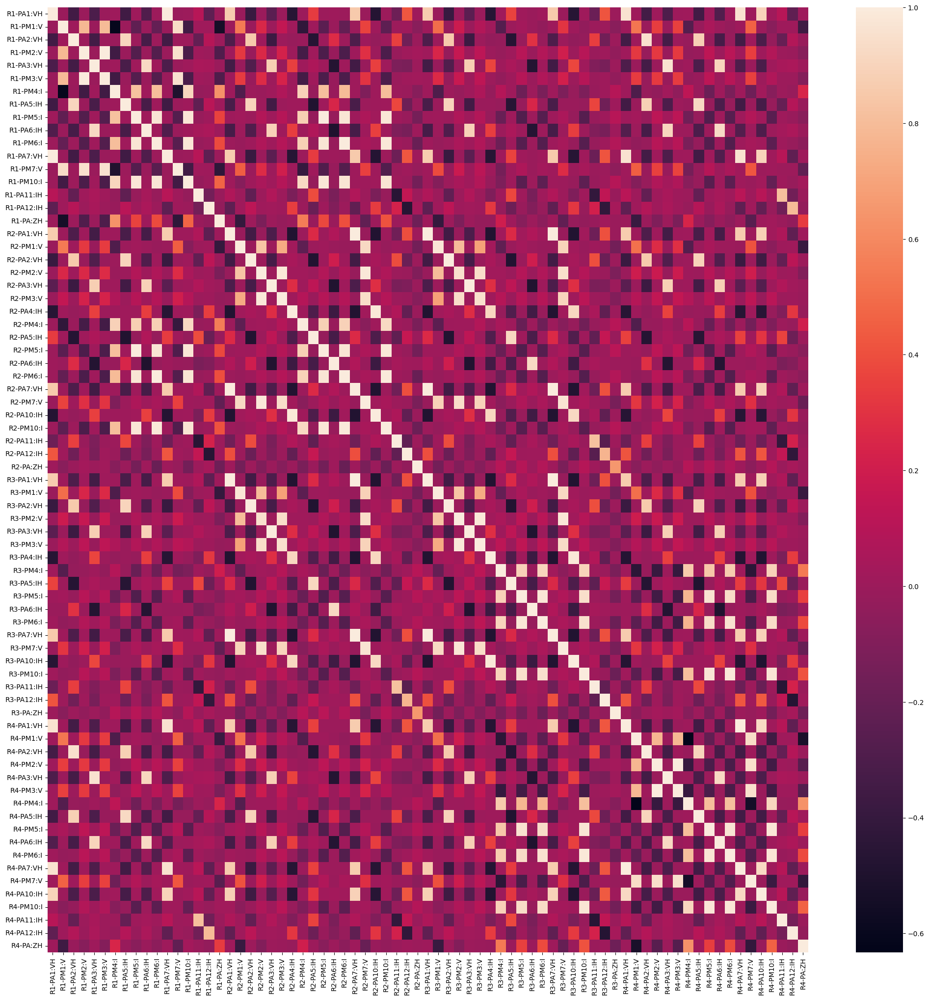

In [10]:
cols = sfm.get_feature_names_out()
feature_vector_1 =pd.DataFrame(feature_vector_1)
feature_vector_1.columns = cols
feature_vector_1



corr = pd.DataFrame(feature_vector_1).corr()

plt.figure(figsize=(25,25))

sns.heatmap(corr)

plt.show()

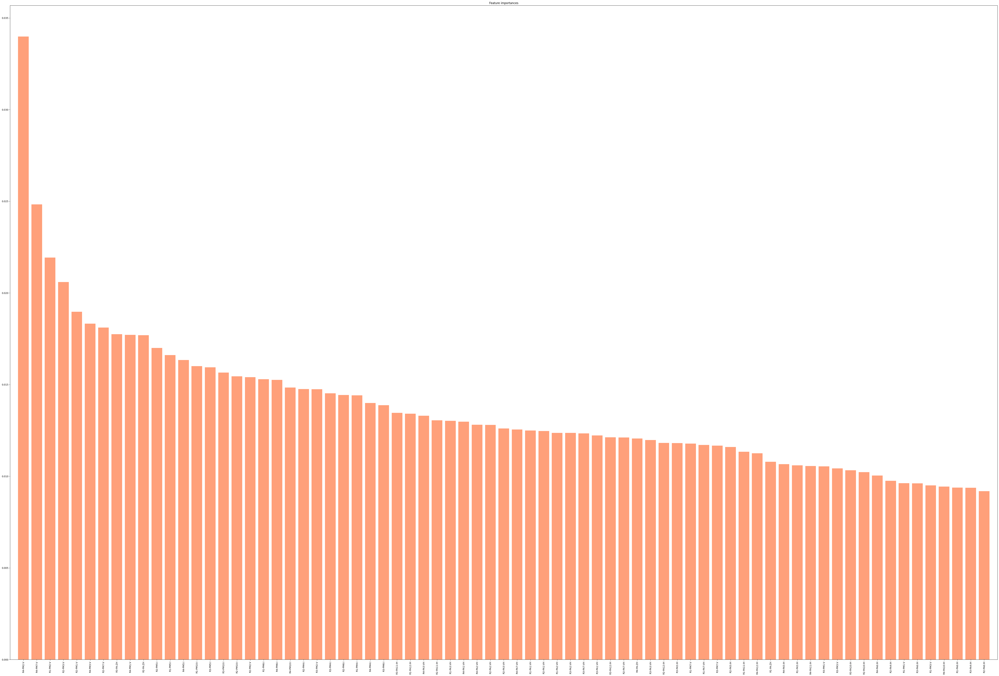

In [11]:
et = ExtraTreesClassifier(n_estimators = 100, class_weight='balanced', random_state=42)
et.fit(feature_vector_1, data['marker'].tolist())
importances = et.feature_importances_
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(75,50))
plt.title("Feature importances")
plt.bar(range(feature_vector_1.shape[1]), importances[indices],
        color="lightsalmon", align="center")
plt.xticks(range(feature_vector_1.shape[1]), feature_vector_1.columns[indices], rotation=90)
plt.xlim([-1, feature_vector_1.shape[1]])
plt.show()

In [12]:
numerical_cols = feature_vector_1.select_dtypes(include=['float64', 'int64']).columns


scaler = RobustScaler()

# Normalize the numerical columns
feature_vector_1[numerical_cols] = scaler.fit_transform(feature_vector_1[numerical_cols])
feature_vector_1
# # Display the normalized DataFrame
# print(data)


,R1-PA1:VH,R1-PM1:V,R1-PA2:VH,R1-PM2:V,R1-PA3:VH,R1-PM3:V,R1-PM4:I,R1-PA5:IH,R1-PM5:I,R1-PA6:IH,...,R4-PM5:I,R4-PA6:IH,R4-PM6:I,R4-PA7:VH,R4-PM7:V,R4-PA10:IH,R4-PM10:I,R4-PA11:IH,R4-PA12:IH,R4-PA:ZH
0,0.937098,1.288889,0.004594,1.521739,-0.803109,1.288889,0.652913,0.012042,0.850801,-0.785585,...,0.847531,-0.783123,0.638573,0.937857,0.944305,0.921097,0.705841,-173.170764,-5.144086,-0.476957
1,0.936520,1.222222,0.004151,1.434783,-0.803813,1.177778,0.657767,0.011345,0.855734,-0.786550,...,0.853717,-0.784197,0.641020,0.937279,0.860367,0.920260,0.709525,-172.987417,-5.103226,-0.458196
2,0.932202,0.577778,0.000692,0.804348,-0.808551,0.555555,0.685680,0.006993,0.871763,-0.793349,...,0.872276,-0.790412,0.664263,0.932956,0.251815,0.914609,0.731631,-174.895367,-5.288889,-0.419051
3,0.906260,-2.200000,-0.020535,-1.913043,-0.836868,-2.200000,0.842233,-0.015872,0.958076,-0.837537,...,0.947750,-0.834571,0.824518,0.906849,-2.350271,0.879203,0.863039,177.210116,-5.934050,0.096545
4,0.934412,0.488889,0.002435,0.717391,-0.805997,0.444444,-0.674757,0.035167,-0.633785,-0.762177,...,-0.649568,-0.759912,-0.698516,0.935066,0.146892,0.943700,-0.683149,178.722725,-4.169176,-1.033886
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
78372,0.382578,0.533333,-0.446766,0.760870,0.918860,0.533333,-0.854369,-0.420120,-0.885327,1.015412,...,-0.878463,1.006485,-0.803722,0.382773,0.272799,0.377285,-0.850171,-154.543906,14.048746,-1.248345
78373,0.381218,0.577778,-0.447873,0.804348,0.917379,0.577778,-0.828883,-0.425226,-0.871763,1.010931,...,-0.869802,1.004145,-0.801275,0.381343,0.272799,0.372506,-0.841575,0.000000,0.000000,-0.954221
78374,0.381184,0.577778,-0.447901,0.804348,0.917342,0.577778,-0.828883,-0.425516,-0.869297,1.010815,...,-0.867327,1.003838,-0.801275,0.381309,0.272799,0.372576,-0.840346,0.000000,0.000000,-0.932723
78375,0.380810,0.577778,-0.448178,0.804348,0.916972,0.577778,-0.828883,-0.426706,-0.868064,1.009695,...,-0.866090,1.003339,-0.797605,0.380969,0.272799,0.371808,-0.839118,0.000000,0.000000,-0.894856


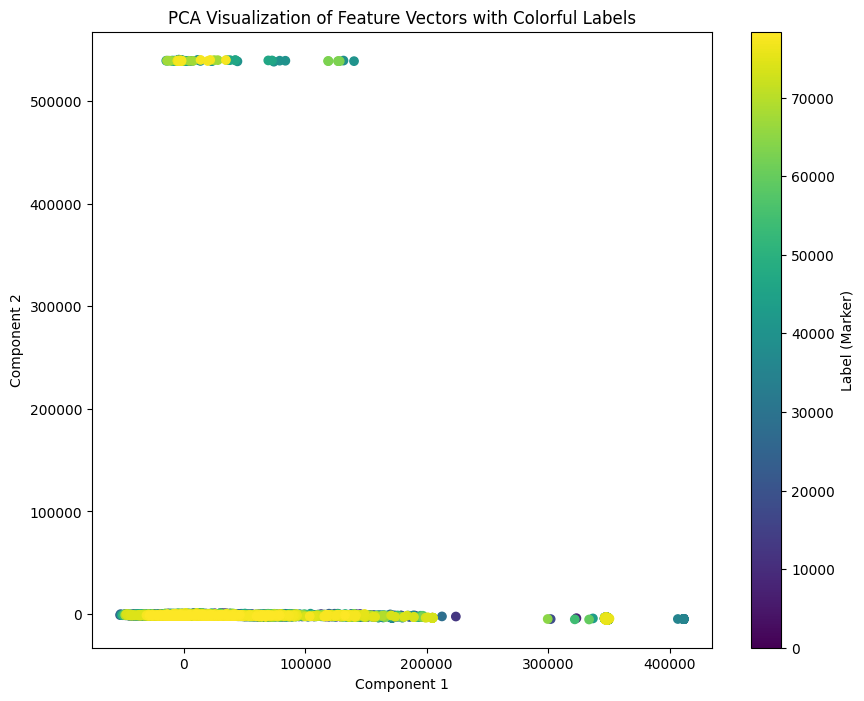

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Assuming 'data' contains your DataFrame with features and labels
features1 = data.drop('marker', axis=1)  # Features
labels = data['marker']  # Labels

# Perform PCA for dimensionality reduction
pca = PCA(n_components=2)  # Reduce to 2 dimensions for visualization
components = pca.fit_transform(features1)
reduced_df = pd.DataFrame(components, columns=['Component 1', 'Component 2'])

# Plot PCA visualization with colored points based on labels
plt.figure(figsize=(10, 8))
plt.scatter(reduced_df['Component 1'], reduced_df['Component 2'], c=range(0,78377), cmap='viridis')
plt.title('PCA Visualization of Feature Vectors with Colorful Labels')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.colorbar(label='Label (Marker)')
plt.show()


Explained Variance Ratio: [0.50922156 0.30467767 0.10109657]


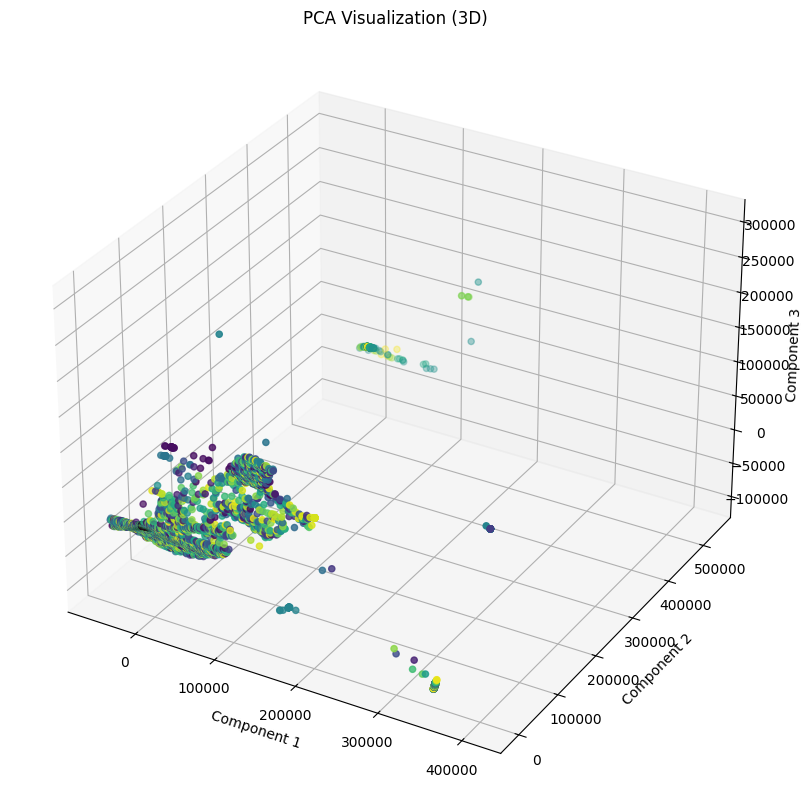

In [14]:
# Assuming 'df' contains your data
features1 = data.drop('marker', axis=1)  # Features
label = data['marker']  # Labels

from sklearn.decomposition import PCA

pca = PCA(n_components=3)  # Reduce to 2 dimensions for visualization
components = pca.fit_transform(features1)
print("Explained Variance Ratio:", pca.explained_variance_ratio_)

import matplotlib.pyplot as plt

# Plotting 3D PCA visualization
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(components[:, 0], components[:, 1], components[:, 2], c=range(0,78377), cmap='viridis')
ax.set_title('PCA Visualization (3D)')
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
plt.show()


In [15]:
# Assuming the target variable is in a column named 'target'
# X = data.drop('marker', axis=1)
X = feature_vector_1
y = data['marker']
# y.value_counts()
# #import LabelEncoder
# #le = LabelEncoder()
# #y_encoded = le.fit_transform(y)

In [16]:
import h2o
from h2o.automl import H2OAutoML

# Initialize H2O cluster
h2o.init()


Checking whether there is an H2O instance running at http://localhost:54321. connected.


/home/danish/anaconda3/envs/AutoML/lib/python3.9/site-packages/requests/__init__.py:109: RequestsDependencyWarning: urllib3 (2.1.0) or chardet (None)/charset_normalizer (3.3.2) doesn't match a supported version!
  warnings.warn(


H2O_cluster_uptime:,3 days 21 hours 17 mins
H2O_cluster_timezone:,Asia/Riyadh
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,1 month and 29 days
H2O_cluster_name:,H2O_from_python_danish_4c3q4p
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,21.68 Gb
H2O_cluster_total_cores:,128
H2O_cluster_allowed_cores:,128
H2O_cluster_status:,"locked, healthy"


In [17]:

# Assuming 'X' is your H2OFrame feature matrix and 'y' is your H2OFrame target variable
# Replace 'attacks' and 'neutral' with the actual class labels in your dataset
# Note: Convert your pandas DataFrame to H2OFrame using h2o.H2OFrame() if needed

# Combine features and target into a single H2OFrame
data = h2o.H2OFrame(pd.concat([X, y], axis=1))
data


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


R1-PA1:VH,R1-PM1:V,R1-PA2:VH,R1-PM2:V,R1-PA3:VH,R1-PM3:V,R1-PM4:I,R1-PA5:IH,R1-PM5:I,R1-PA6:IH,R1-PM6:I,R1-PA7:VH,R1-PM7:V,R1-PM10:I,R1-PA11:IH,R1-PA12:IH,R1-PA:ZH,R2-PA1:VH,R2-PM1:V,R2-PA2:VH,R2-PM2:V,R2-PA3:VH,R2-PM3:V,R2-PA4:IH,R2-PM4:I,R2-PA5:IH,R2-PM5:I,R2-PA6:IH,R2-PM6:I,R2-PA7:VH,R2-PM7:V,R2-PA10:IH,R2-PM10:I,R2-PA11:IH,R2-PA12:IH,R2-PA:ZH,R3-PA1:VH,R3-PM1:V,R3-PA2:VH,R3-PM2:V,R3-PA3:VH,R3-PM3:V,R3-PA4:IH,R3-PM4:I,R3-PA5:IH,R3-PM5:I,R3-PA6:IH,R3-PM6:I,R3-PA7:VH,R3-PM7:V,R3-PA10:IH,R3-PM10:I,R3-PA11:IH,R3-PA12:IH,R3-PA:ZH,R4-PA1:VH,R4-PM1:V,R4-PA2:VH,R4-PM2:V,R4-PA3:VH,R4-PM3:V,R4-PM4:I,R4-PA5:IH,R4-PM5:I,R4-PA6:IH,R4-PM6:I,R4-PA7:VH,R4-PM7:V,R4-PA10:IH,R4-PM10:I,R4-PA11:IH,R4-PA12:IH,R4-PA:ZH,marker
0.937098,1.28889,0.00459414,1.52174,-0.803109,1.28889,0.652913,0.0120416,0.850801,-0.785585,0.628502,0.937194,1.40909,0.700855,-174.065,-2.67227,-0.46586,0.886034,0.560196,-0.0536063,0.522698,-0.853528,0.579574,-0.489206,0.655264,1.23448,0.851084,0.349321,0.639079,0.88576,0.561765,-0.499073,0.713645,-0.260925,12.4292,77.6846,0.886083,0.421687,-0.0537184,0.487805,-0.853122,0.402439,-0.485085,0.6691,1.22812,0.850617,0.350602,0.645554,0.88605,0.45122,-0.495486,0.718673,-2.05119,13.159,80.8561,0.937992,1.02943,0.00545193,0.728611,-0.804792,1.04695,0.657736,0.0145894,0.847531,-0.783123,0.638573,0.937857,0.944305,0.921097,0.705841,-173.171,-5.14409,-0.476957,NoEvents
0.93652,1.22222,0.00415133,1.43478,-0.803813,1.17778,0.657767,0.0113452,0.855734,-0.78655,0.633374,0.936616,1.31818,0.704518,-174.271,-2.66602,-0.451963,0.885422,0.510483,-0.0541252,0.473386,-0.854258,0.528346,-0.489895,0.657871,1.23393,0.853958,0.348769,0.643953,0.885149,0.511657,-0.499664,0.717279,-0.304871,12.4079,77.6847,0.885411,0.373494,-0.0542596,0.439024,-0.853845,0.353659,-0.4857,0.672749,1.22739,0.853086,0.349993,0.650426,0.885412,0.402439,-0.496135,0.72113,-2.20016,13.106,80.8427,0.937379,0.963725,0.00503681,0.651915,-0.805384,0.959703,0.661409,0.0139223,0.853717,-0.784197,0.64102,0.937279,0.860367,0.92026,0.709525,-172.987,-5.10323,-0.458196,NoEvents
0.932202,0.577778,0.000691888,0.804348,-0.808551,0.555555,0.68568,0.0069928,0.871763,-0.793349,0.657734,0.932297,0.659091,0.728938,-176.167,-2.75156,-0.397834,0.880624,0.147321,-0.0581666,0.110955,-0.859655,0.167983,-0.495501,0.684209,1.22848,0.873541,0.344458,0.667872,0.880385,0.149047,-0.504846,0.740802,-2.38678,12.36,77.7293,0.880676,0.0120482,-0.0583041,0.0609756,-0.859245,-0.0121951,-0.49116,0.693431,1.22224,0.875309,0.345325,0.674787,0.880645,0.0365854,-0.5013,0.744472,-2.29756,13.0598,80.8816,0.933056,0.328542,0.00152211,0.115044,-0.810115,0.327172,0.685899,0.0092815,0.872276,-0.790412,0.664263,0.932956,0.251815,0.914609,0.731631,-174.895,-5.28889,-0.419051,NoEvents
0.90626,-2.2,-0.0205352,-1.91304,-0.836868,-2.2,0.842233,-0.0158716,0.958076,-0.837537,0.818514,0.906284,-2.18182,0.864469,176.11,-2.93867,0.133027,0.852449,-1.42957,-0.0820326,-1.48284,-0.891564,-1.44071,-0.531632,0.840908,1.20044,0.958277,0.313511,0.828728,0.852193,-1.44676,-0.537154,0.878076,-10.0882,12.0522,78.1483,0.852465,-1.59036,-0.0821727,-1.54878,-0.89123,-1.62195,-0.52727,0.847932,1.19419,0.954321,0.313901,0.836784,0.852443,-1.58537,-0.533755,0.879607,-10.319,12.6439,-1.20179,0.906914,-2.36551,-0.0195937,-2.30088,-0.838542,-2.37745,0.837738,-0.0137192,0.94775,-0.834571,0.824518,0.906849,-2.35027,0.879203,0.863039,177.21,-5.93405,0.0965446,NoEvents
0.934412,0.488889,0.00243545,0.717391,-0.805997,0.444444,-0.674757,0.0351671,-0.633785,-0.762177,-0.696711,0.934474,0.568182,-0.675214,-179.851,-1.86172,-0.895202,0.902391,0.708333,-0.0397618,0.673689,-0.834966,0.732394,-0.503927,-0.674812,1.22904,-0.63694,0.340424,-0.69009,0.902109,0.712082,-0.50888,-0.676276,-13.6038,12.9158,-0.286728,0.902438,0.566265,-0.0398473,0.634146,-0.834715,0.548781,-0.500512,-0.673966,1.22277,-0.645679,0.3406,-0.694275,0.902367,0.597561,-0.505917,-0.679361,-15.2006,13.8433,-0.152439,0.935099,0.240931,0.00334865,0,-0.807823,0.218114,-0.681872,0.0375031,-0.64956

In [18]:

# Identify predictor and response variables
predictors = X.columns.tolist()
response = 'marker'  # Replace with the actual name of your target column


In [19]:

# Split the data into training and testing sets
train, test = data.split_frame(ratios=[0.8], seed=42)
train.shape

(62647, 74)

In [20]:

# Initialize and train AutoML
aml = H2OAutoML(max_models=50, seed=42)
aml.train(x=predictors, y=response, training_frame=train)

# # Save the best model to disk
# model_path = '/home/danish/Codes/AutoML/H2o'
# h2o.save_model(model=best_model, path=model_path, force=True)



# # Load the saved model 
# best_model = h2o.load_model('/home/danish/Codes/AutoML/H2o/StackedEnsemble_AllModels_1_AutoML_8_20240512_120210')



AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),50/50
# GBM base models (used / total),15/15
# XGBoost base models (used / total),18/18
# DRF base models (used / total),2/2
# DeepLearning base models (used / total),14/14
# GLM base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [21]:

# Get the best model from AutoML
best_model = aml.leader

# Make predictions on the test set
# predictions = best_model.predict(test)


In [22]:

# Optionally, you can evaluate the performance
test_metrics = best_model.model_performance(test)
print(test_metrics)


ModelMetricsMultinomialGLM: stackedensemble
** Reported on test data. **

MSE: 0.04226614175120218
RMSE: 0.2055873093145639
LogLoss: 0.1470762969135603
Null degrees of freedom: 15729
Residual degrees of freedom: 15529
Null deviance: 23524.908437133574
Residual deviance: 4627.020300900608
AUC table was not computed: it is either disabled (model parameter 'auc_type' was set to AUTO or NONE) or the domain size exceeds the limit (maximum is 50 domains).
AUCPR table was not computed: it is either disabled (model parameter 'auc_type' was set to AUTO or NONE) or the domain size exceeds the limit (maximum is 50 domains).

Confusion Matrix: Row labels: Actual class; Column labels: Predicted class
Attack    Natural    NoEvents    Error      Rate
--------  ---------  ----------  ---------  ------------
10900     260        8           0.0239971  268 / 11,168
577       3068       0           0.158299   577 / 3,645
34        4          879         0.0414395  38 / 917
11511     3332       887       

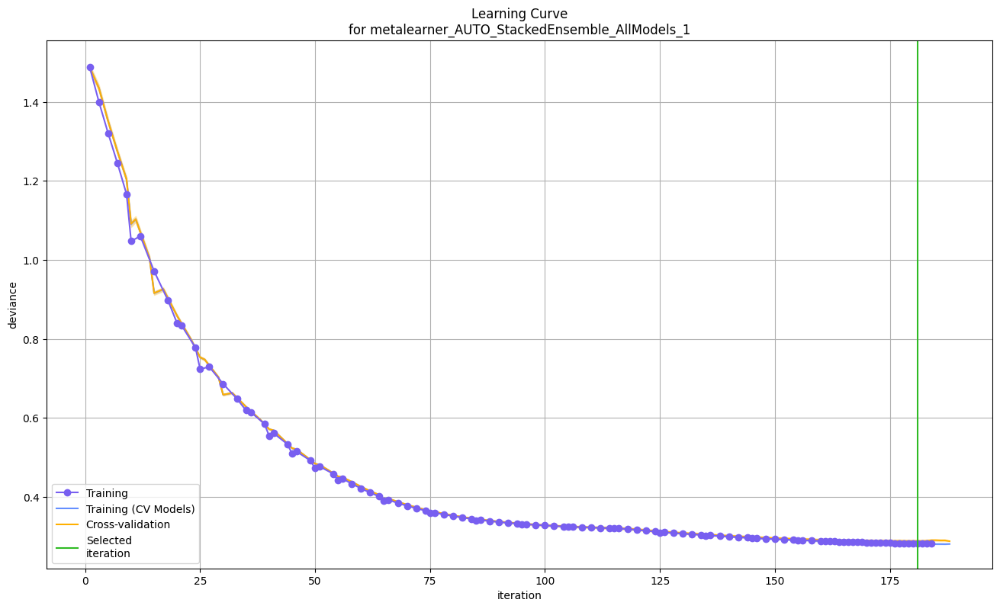

In [23]:
best_model.learning_curve_plot()

In [24]:
predictions = best_model.predict(test)

y_true = test['marker']
y_pred = predictions['predict']

stackedensemble prediction progress: |███████████████████████████████████████████| (done) 100%


In [25]:
from sklearn.preprocessing import LabelBinarizer

label_binarizer = LabelBinarizer().fit(train['marker'].as_data_frame())
y_true_ = label_binarizer.transform(test['marker'].as_data_frame())
y_pred_ = label_binarizer.transform(y_pred.as_data_frame())


print(y_true_.shape)
print(y_pred_.shape)# (n_samples, n_classes)

# from sklearn.preprocessing import LabelEncoder
# le = LabelEncoder()
# y_true_ = le.fit_transform(y_true_)
# y_pred_ = le.fit_transform(y_pred_)


# print(y_true_)
# print(y_pred_)

(15730, 3)
(15730, 3)


/home/danish/anaconda3/envs/AutoML/lib/python3.9/site-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"
/home/danish/anaconda3/envs/AutoML/lib/python3.9/site-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_d

In [41]:
classes=np.unique(train['marker'].as_data_frame())

/home/danish/anaconda3/envs/AutoML/lib/python3.9/site-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


In [42]:
classes

array(['Attack', 'Natural', 'NoEvents'], dtype=object)

/home/danish/anaconda3/envs/AutoML/lib/python3.9/site-packages/h2o/frame.py:1983: H2ODependencyWarning: Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using multi-thread, install datatable (for Python 3.9 or lower), or polars and pyarrow (for Python 3.10 or above) and activate it using:

with h2o.utils.threading.local_context(polars_enabled=True, datatable_enabled=True):
    pandas_df = h2o_df.as_data_frame()

  warnings.warn("Converting H2O frame to pandas dataframe using single-thread.  For faster conversion using"


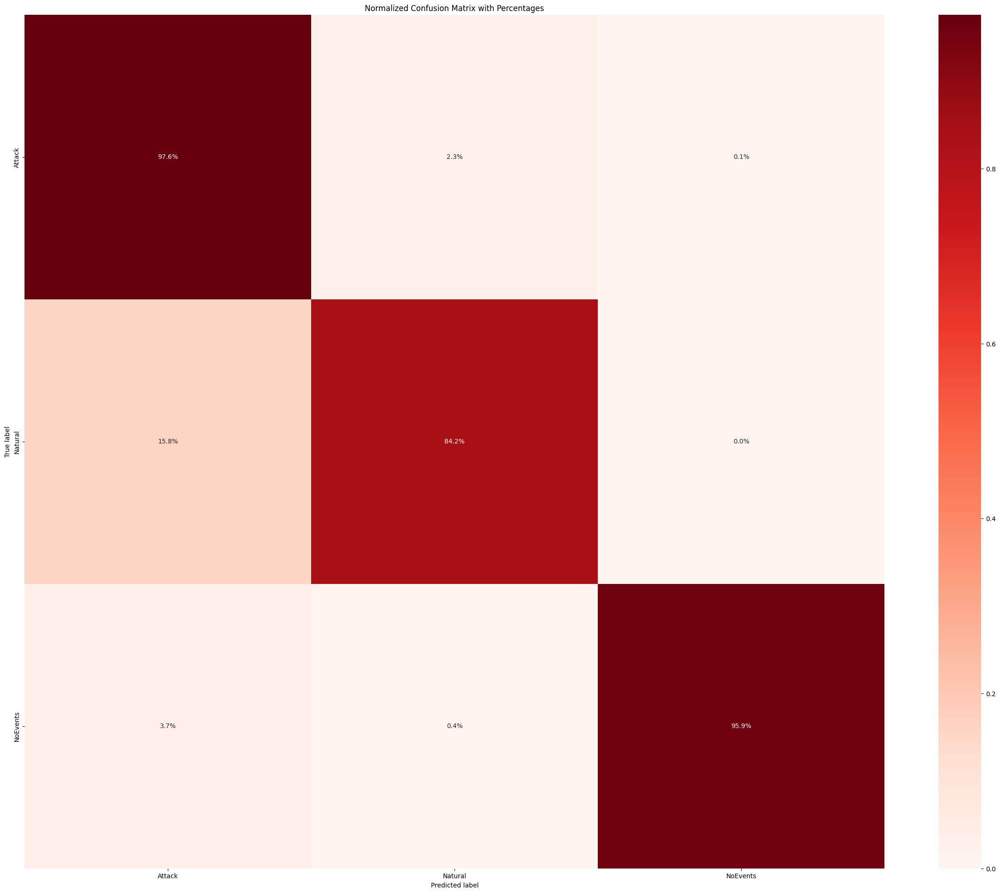

In [43]:

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import normalize

# Example data
classes=np.unique(train['marker'].as_data_frame())



# Compute confusion matrix
cnf_matrix = confusion_matrix(y_true_.argmax(axis=1), y_pred_.argmax(axis=1))

# Normalize confusion matrix
cnf_matrix_norm = normalize(cnf_matrix, axis=1, norm='l1')

# Plot confusion matrix with percentages
plt.figure(figsize=(30, 24))
sns.heatmap(cnf_matrix_norm, annot=True, cmap='Reds', fmt='.1%', xticklabels=classes, yticklabels=classes)
plt.title('Normalized Confusion Matrix with Percentages')
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.show()

In [32]:
from sklearn.metrics import classification_report
# Compute classification report
class_report = classification_report(y_true_, y_pred_)
print("Classification Report:")
print(class_report)


Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.98      0.96     11168
           1       0.92      0.84      0.88      3645
           2       0.99      0.96      0.97       917

   micro avg       0.94      0.94      0.94     15730
   macro avg       0.95      0.93      0.94     15730
weighted avg       0.94      0.94      0.94     15730
 samples avg       0.94      0.94      0.94     15730



In [44]:
# # Save the best model to disk
# model_path = '/home/danish/Codes/AutoML/H2o/ICS_Dataset_2_With_Feature_Eng'
# h2o.save_model(model=best_model, path=model_path, force=True)




# # Load the saved model 
best_model = h2o.load_model('/home/danish/Codes/AutoML/H2o/ICS_Dataset_2_With_Feature_Eng/StackedEnsemble_AllModels_1_AutoML_6_20240513_130116')

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## StackedEnsemble_AllModels_1_AutoML_6_20240513_130116

Attack,Natural,NoEvents,Error,Rate
10900.0,260.0,8.0,0.0239971,"268 / 11,168"
577.0,3068.0,0.0,0.1582990,"577 / 3,645"
34.0,4.0,879.0,0.0414395,38 / 917
11511.0,3332.0,887.0,0.0561348,"883 / 15,730"


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

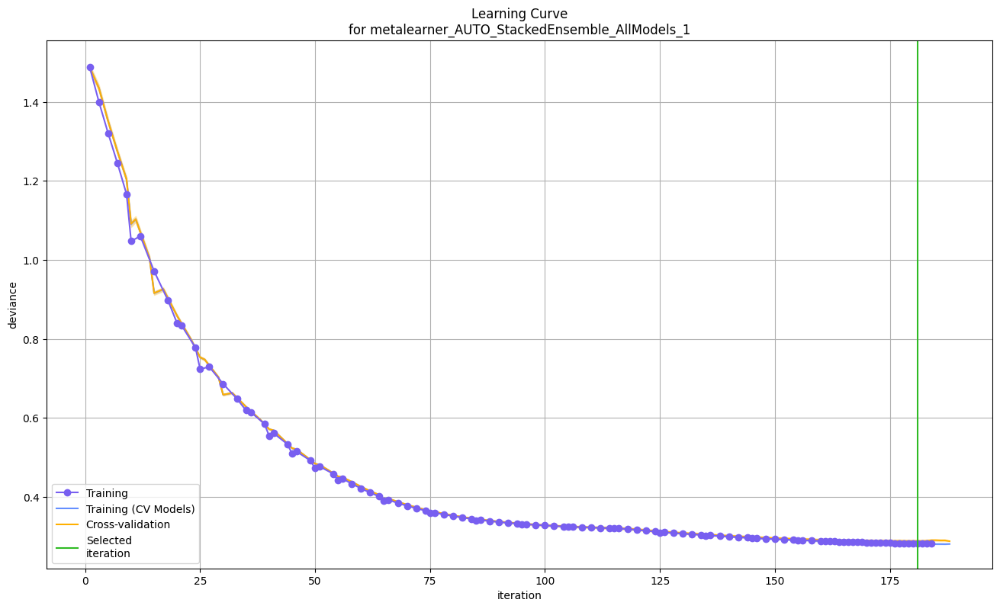

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

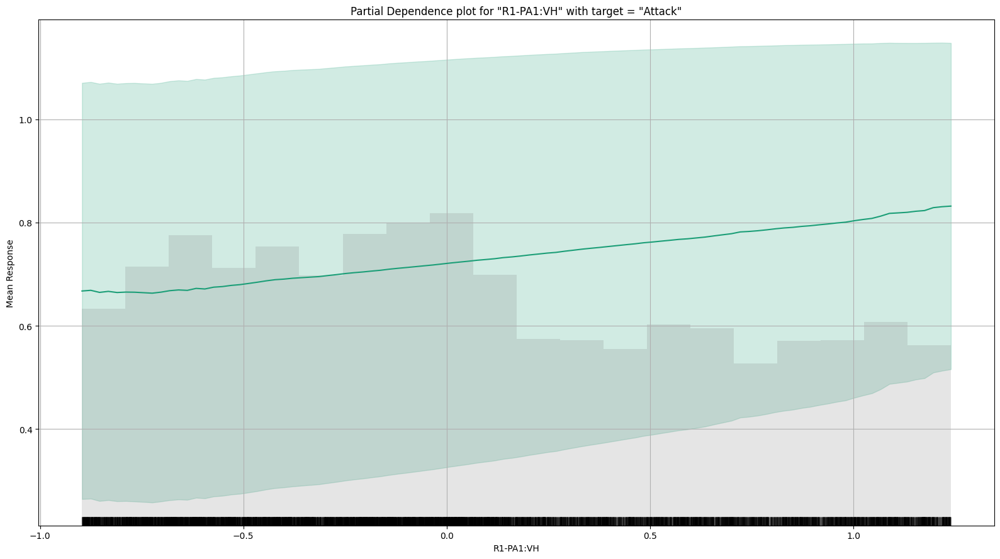

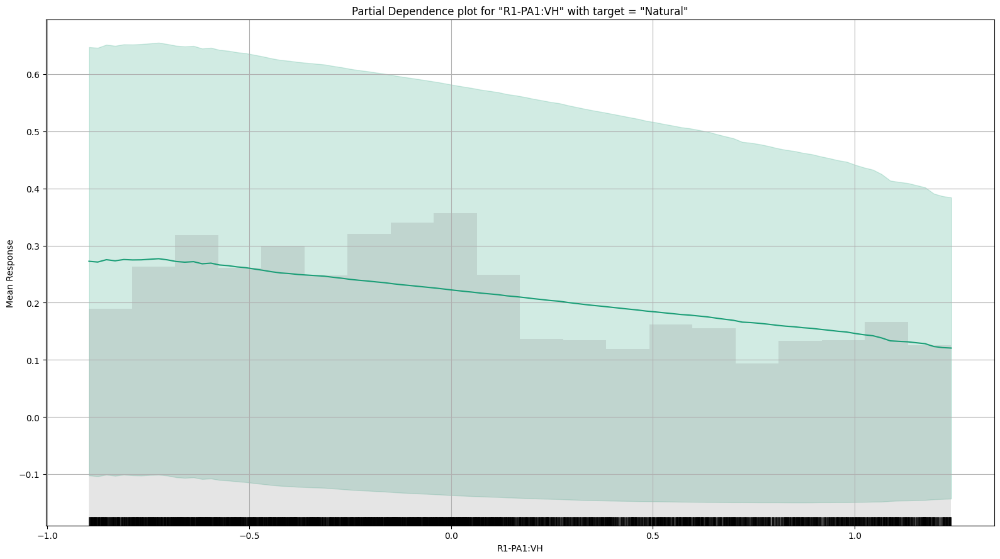

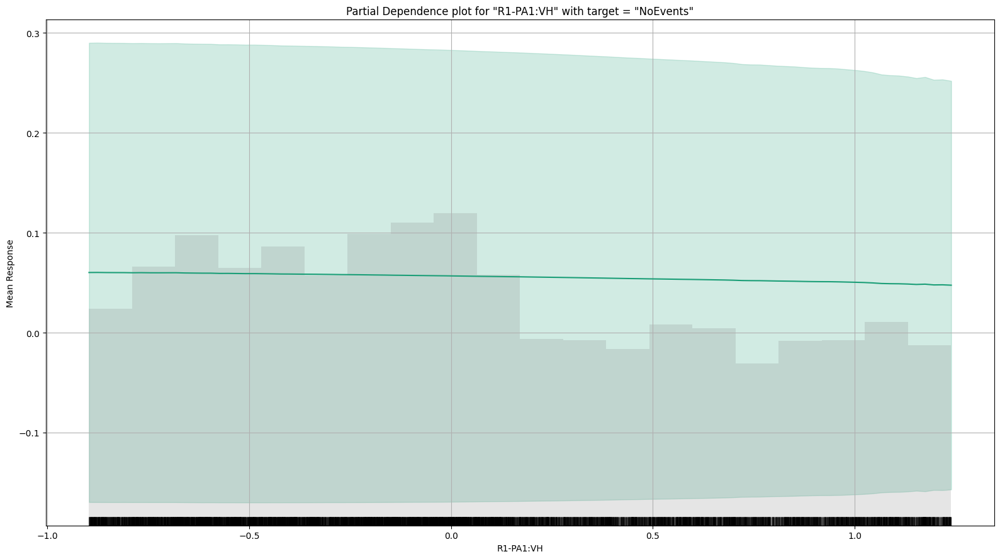

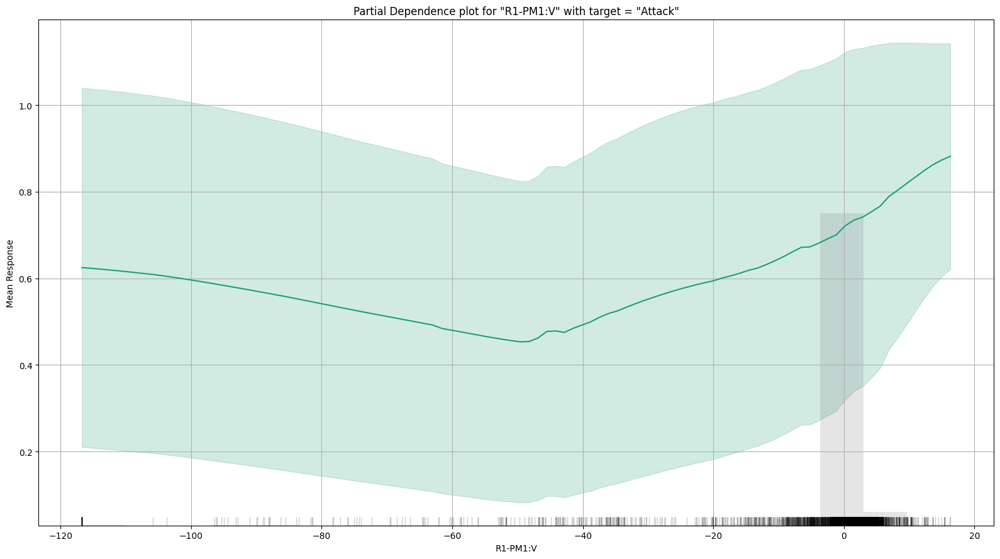

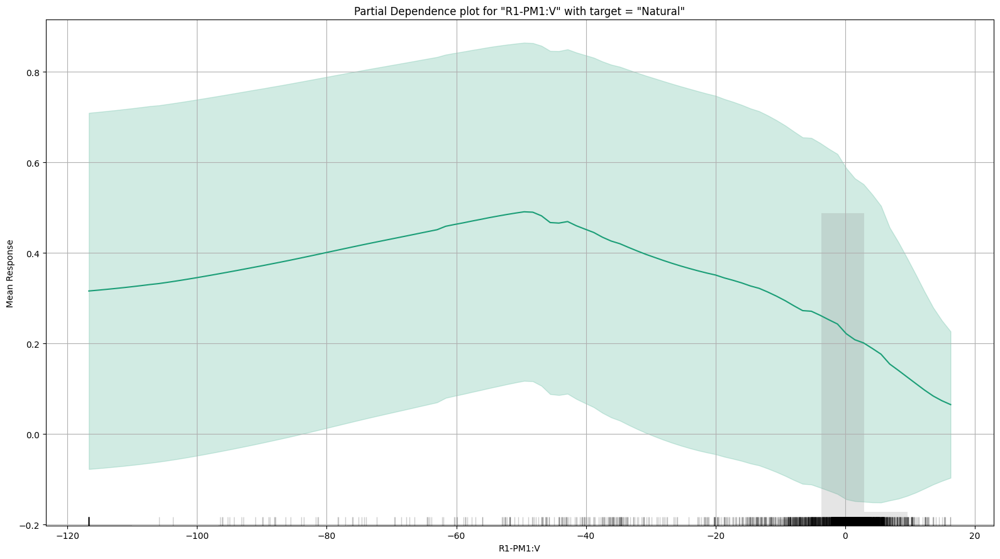

...

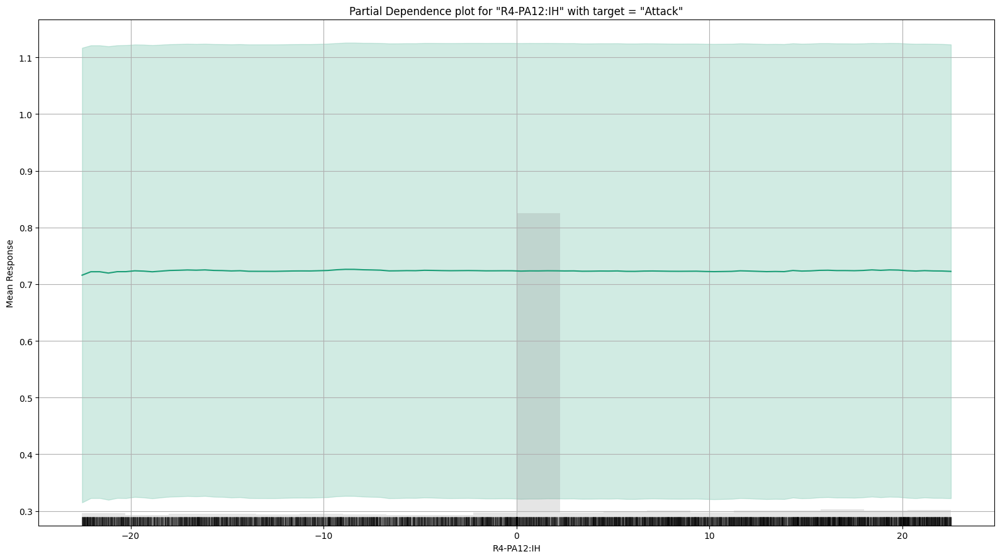

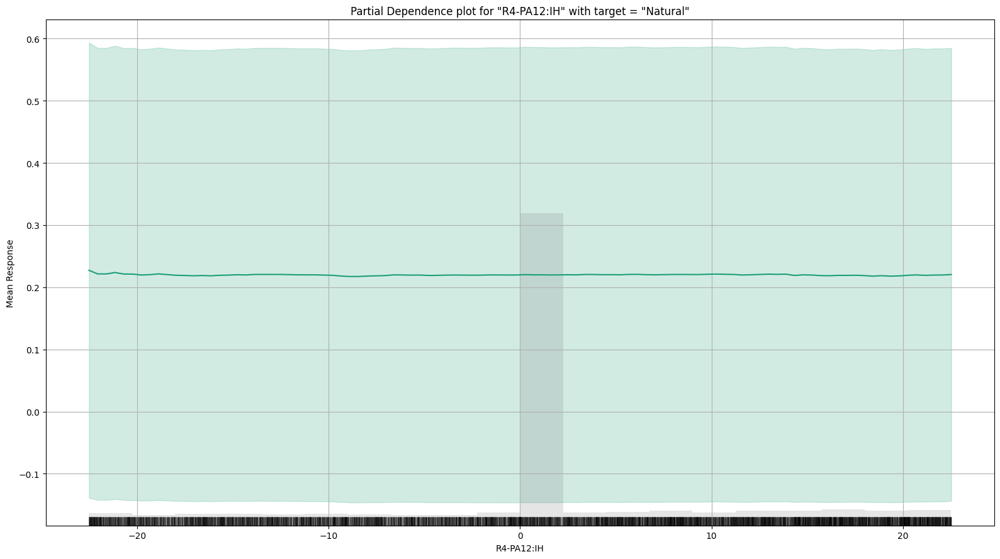

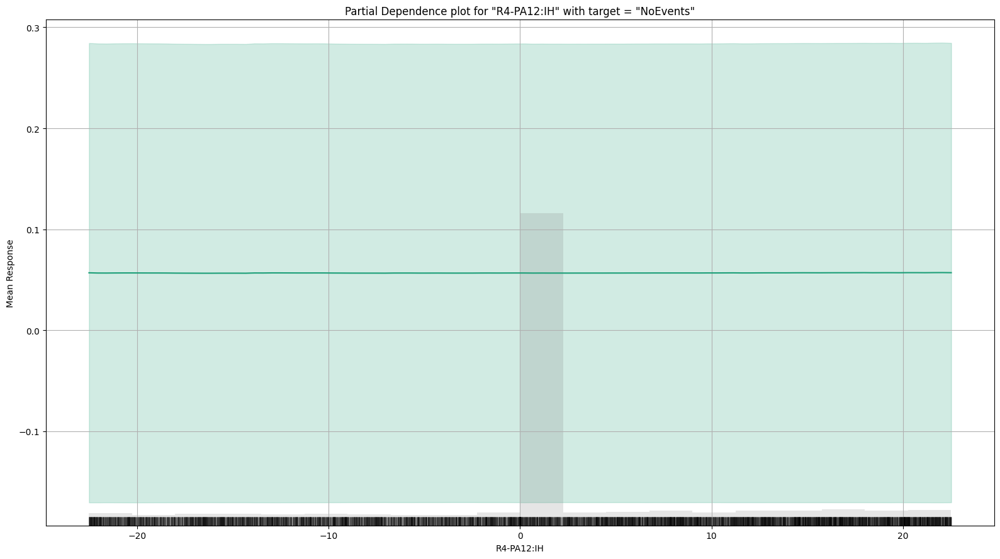

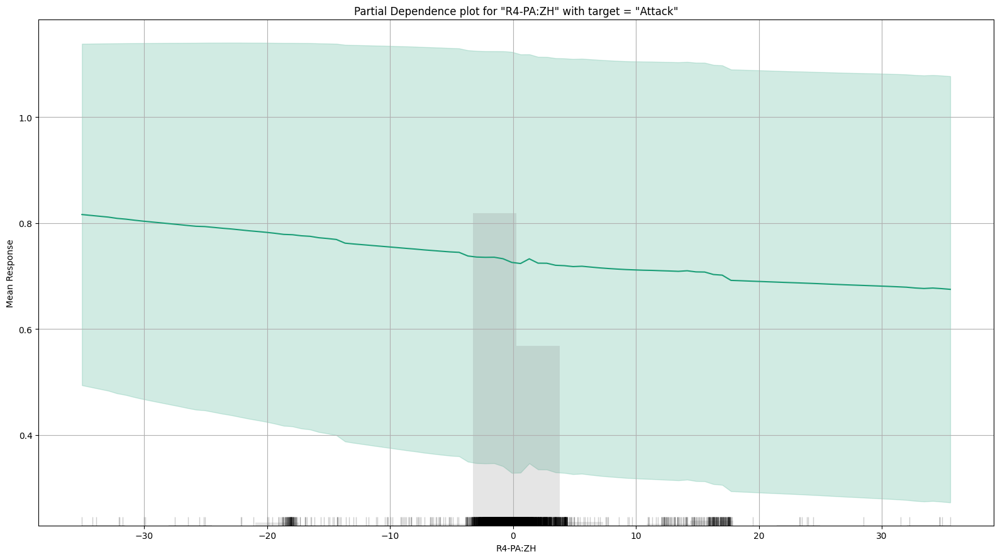

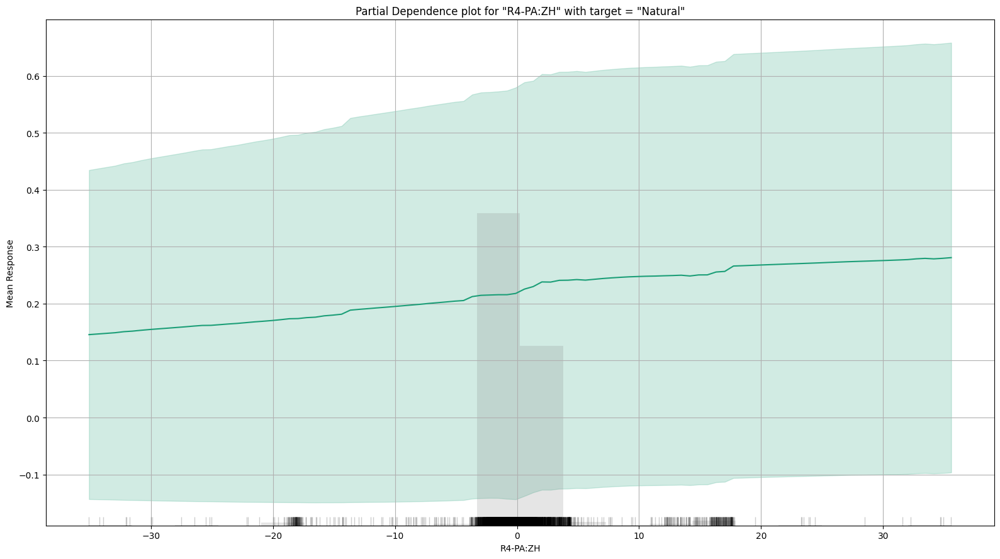

In [63]:
best_model.explain(test)